In [25]:
import numpy as np 
import pandas as pd
import random
import os
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, TSNE
import matplotlib.pyplot as plt
from matplotlib import offsetbox

In [26]:
data = pd.read_csv('/kaggle/input/visual-taxonomy/train.csv')

In [27]:
data.head()

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


In [28]:
data.describe(include = 'all')

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
count,70213.000000,70213,70213.000000,51867,55192,54698,59888,56493,38116,41415,37474,33565,24999
unique,NaN,5,NaN,18,14,10,19,14,7,11,10,13,8
top,NaN,Women Tops & Tunics,NaN,default,regular,regular,printed,casual,short sleeves,regular sleeves,zari woven,regular sleeves,no
freq,NaN,19004,NaN,9268,17222,15546,14285,12358,13703,14661,13533,7480,14835
mean,35254.985872,NaN,8.850569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,20295.174166,NaN,1.559819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,NaN,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,17718.000000,NaN,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,35272.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,52825.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Task 1**

In [29]:
categories = ["Men Tshirts", "Sarees", "Kurtis", "Women Tshirts", "Women Tops & Tunics"]
samples = {}
random.seed(41)
for category in categories:
    attributes = ["attr_1", "attr_2", "attr_3", "attr_4", "attr_5", "attr_6", "attr_7", "attr_8", "attr_9", "attr_10"]
    i = 0
    while i<2:
        attr = random.choice(attributes) 
        basket = data[(data['Category'] == category) & (data[attr].notna())]
        if len(basket) >= 100:
            samples[f'{category}_{attr}'] = basket['id'].sample(100).tolist()
            i = i+1
            attributes.remove(attr)

In [30]:
print(samples.items())

dict_items([('Men Tshirts_attr_4', [5962, 5360, 2059, 6244, 1464, 3123, 226, 1392, 3389, 3174, 3501, 2768, 678, 5215, 82, 4021, 4318, 2071, 414, 7088, 2731, 4882, 4688, 1338, 2521, 1993, 2171, 2919, 1254, 3783, 5914, 1536, 4521, 3806, 2106, 2397, 1804, 2652, 1620, 3634, 1601, 2928, 2480, 3359, 913, 483, 2646, 3334, 2486, 2451, 5436, 6730, 694, 5675, 441, 3211, 2198, 2012, 3929, 4875, 2779, 3497, 2604, 5323, 4410, 2334, 4497, 4397, 4485, 7134, 1664, 4842, 9, 6773, 793, 3691, 765, 463, 5923, 357, 5454, 2797, 4337, 4193, 827, 707, 1907, 568, 3273, 1281, 201, 3664, 2387, 2806, 3507, 3645, 4321, 718, 2406, 2206]), ('Men Tshirts_attr_3', [6164, 2330, 3373, 4208, 205, 2306, 888, 6143, 1296, 2476, 86, 2735, 1661, 2134, 4626, 2812, 418, 1415, 5981, 3464, 4371, 1547, 252, 272, 1576, 4981, 4486, 3288, 5390, 2142, 6308, 146, 6139, 5033, 152, 3068, 976, 675, 1066, 4771, 4043, 4591, 3898, 3247, 2991, 1714, 1856, 4512, 1567, 4089, 4674, 1005, 4628, 2953, 3253, 4966, 1568, 2984, 3058, 1701, 2988, 7389

Created 10 baskets for all 5 different categories with random attributes.

**Task 2 and Task 3** 


In [47]:
def load_and_preprocess_images(ids):
    images = []
    actual_images=[]
    for product_id in ids:
        formatted_id = str(product_id).zfill(6)
        img_path = f"/kaggle/input/visual-taxonomy/train_images/{formatted_id}.jpg"
        img = Image.open(img_path) 
        img = img.resize((64, 64))
        images.append(np.array(img).flatten())
        actual_images.append(img)
    return np.array(images), actual_images


def plot_components(data, model, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()

    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')

    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)

In [48]:
isomap = Isomap(n_neighbors=5, n_components=2)
tsne = TSNE(n_components=2, random_state=42)

a.) **Men Tshirts**

In [50]:
images, actual_images = load_and_preprocess_images(samples['Men Tshirts_attr_4'])

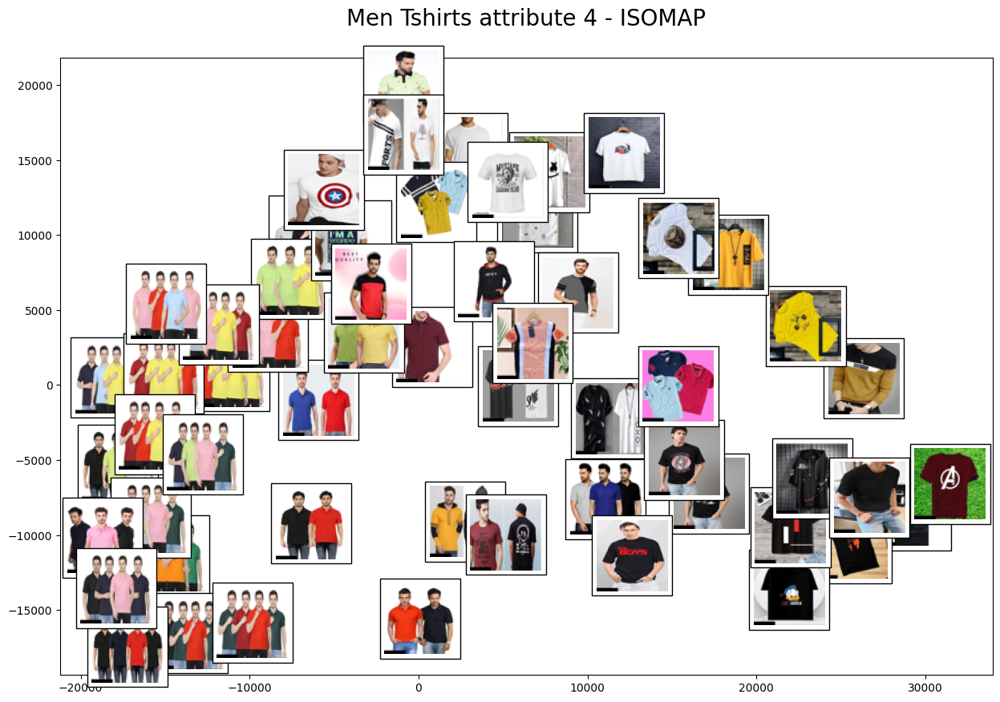

In [51]:
plot_components(images,isomap, actual_images)
plt.title("Men Tshirts attribute 4 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

**Interpretation**

1. X-axis: Color Intensity & Formality
T-shirts on the left have neutral or pastel solid shades, while we see graphic designs on the right side of the plot.

2. Y-axis: Design Complexity
As we go from bottom to top, the pattern changes from unprinted design to graphical designs on the shirt.

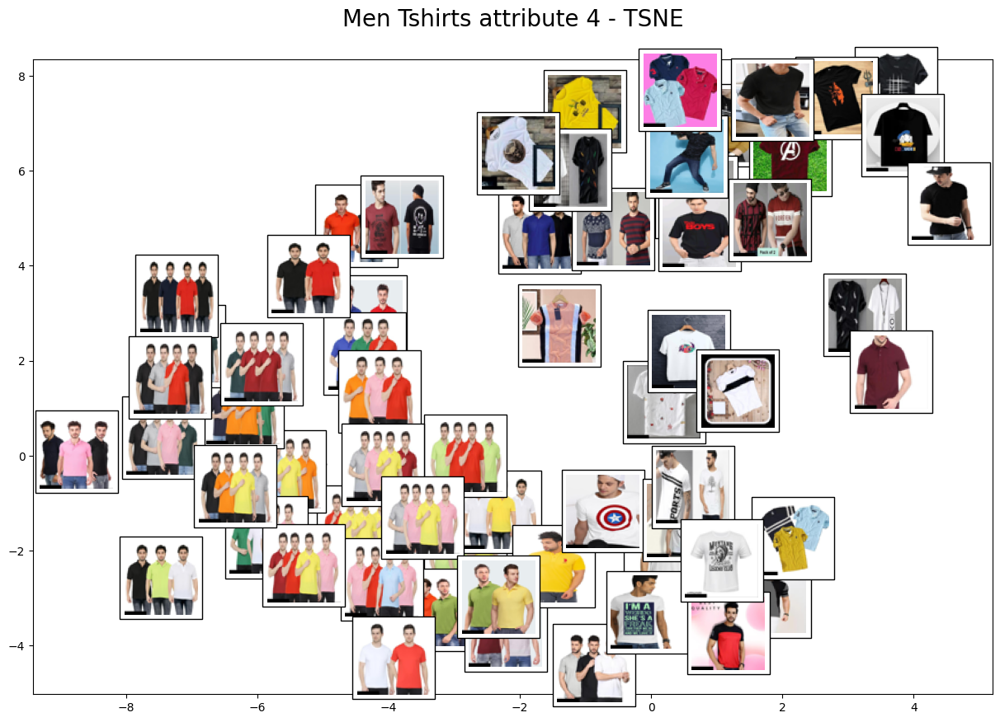

In [52]:
plot_components(images,tsne, actual_images)
plt.title("Men Tshirts attribute 4 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

**Interpretation**

1. X Axis: Colours:
From left to right, colours change from solid pastels to vibrant graphic designs. 
2. Yaxis: designs
From bottom to top, moves from plain shirts to those with graphics, logos, or branding.

In [53]:
images, actual_images = load_and_preprocess_images(samples['Men Tshirts_attr_3'])

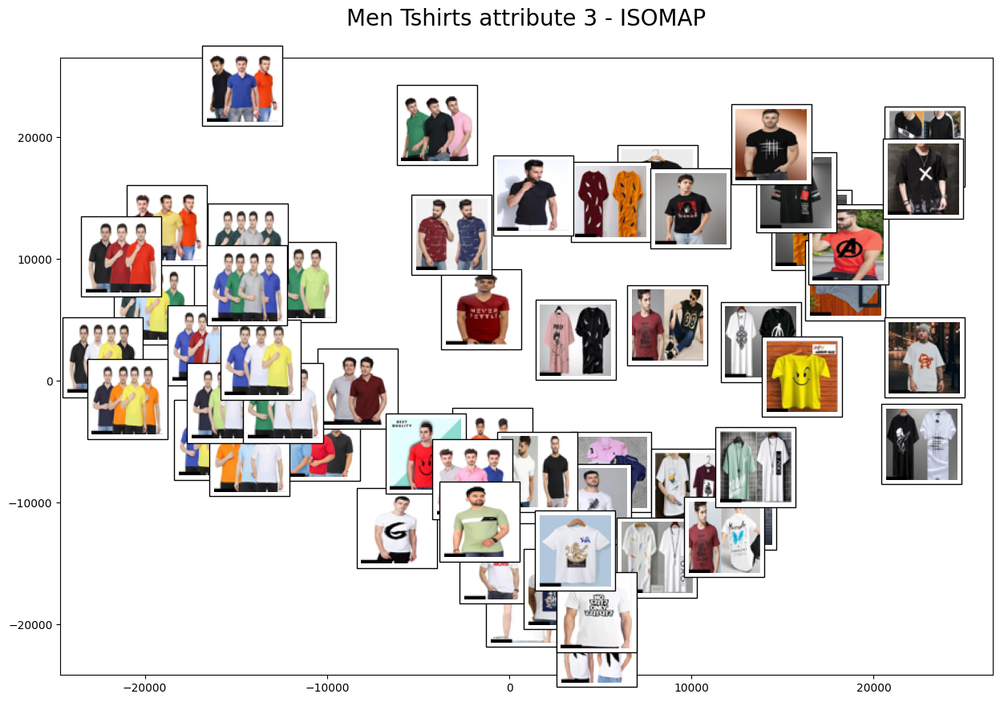

In [54]:
plot_components(images,isomap, actual_images)
plt.title("Men Tshirts attribute 3 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

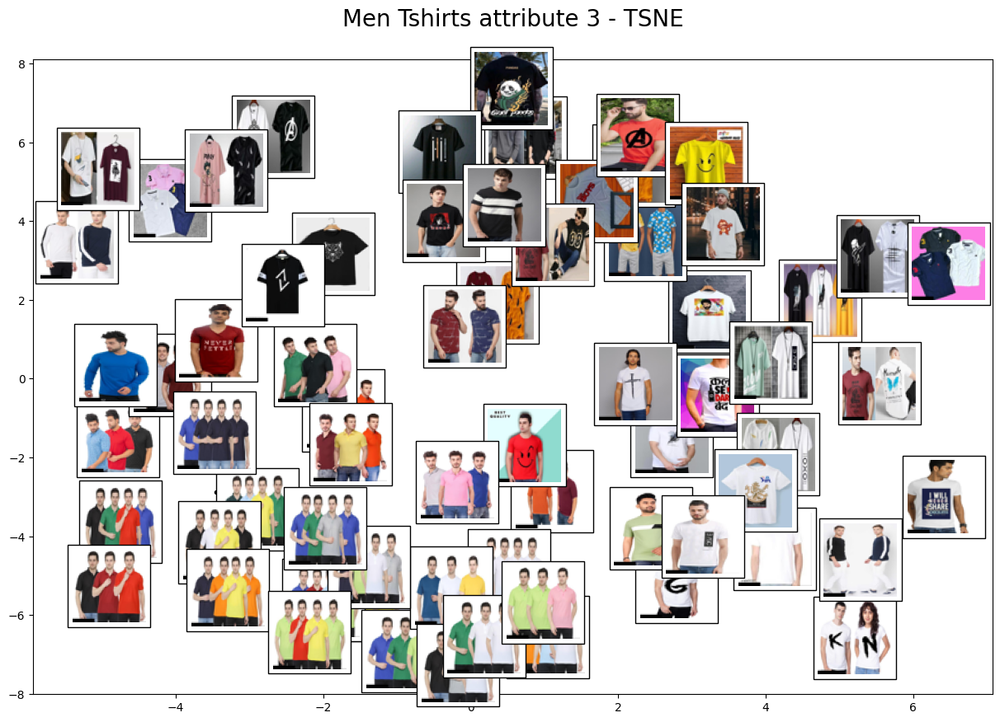

In [55]:
plot_components(images,tsne, actual_images)
plt.title("Men Tshirts attribute 3 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X - axis:  Color shade go from dark to light from left to right

Y - axis: We see more graphical designs as we go from the bottom to top.

b.) **SAREES**

In [56]:
images, actual_images = load_and_preprocess_images(samples['Sarees_attr_7'])

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


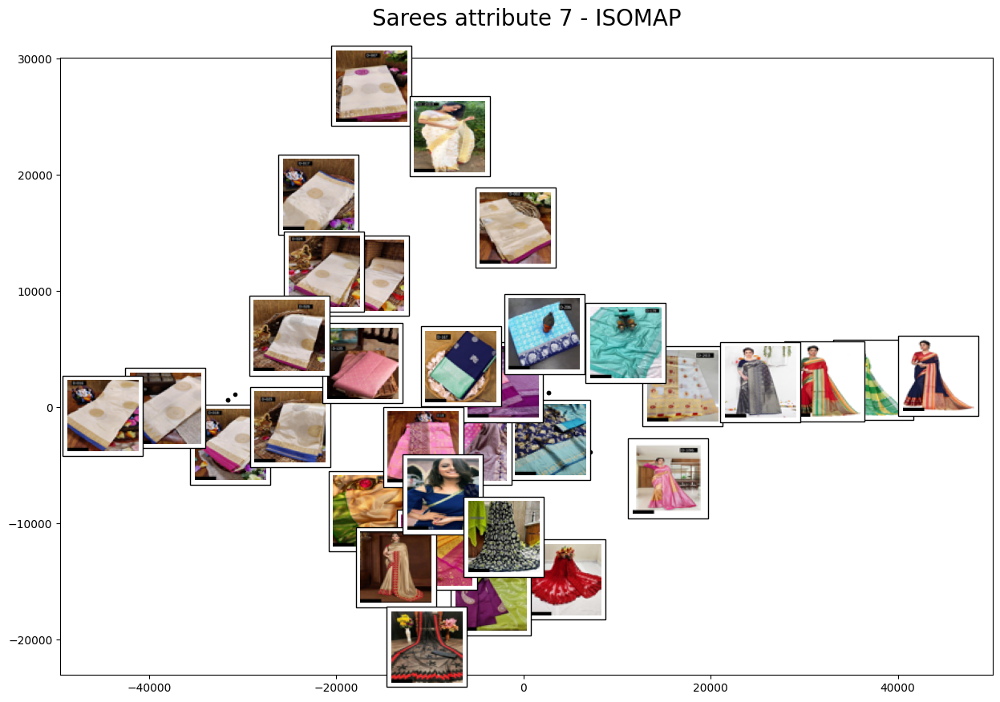

In [57]:
plot_components(images,isomap, actual_images)
plt.title("Sarees attribute 7 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X - axis: The colours change from pastels to more colourful from left to right. Patterns change from circular prints to heavy designs from left to right

Y - axis: Colours go from dark to light as we go from bottom to top

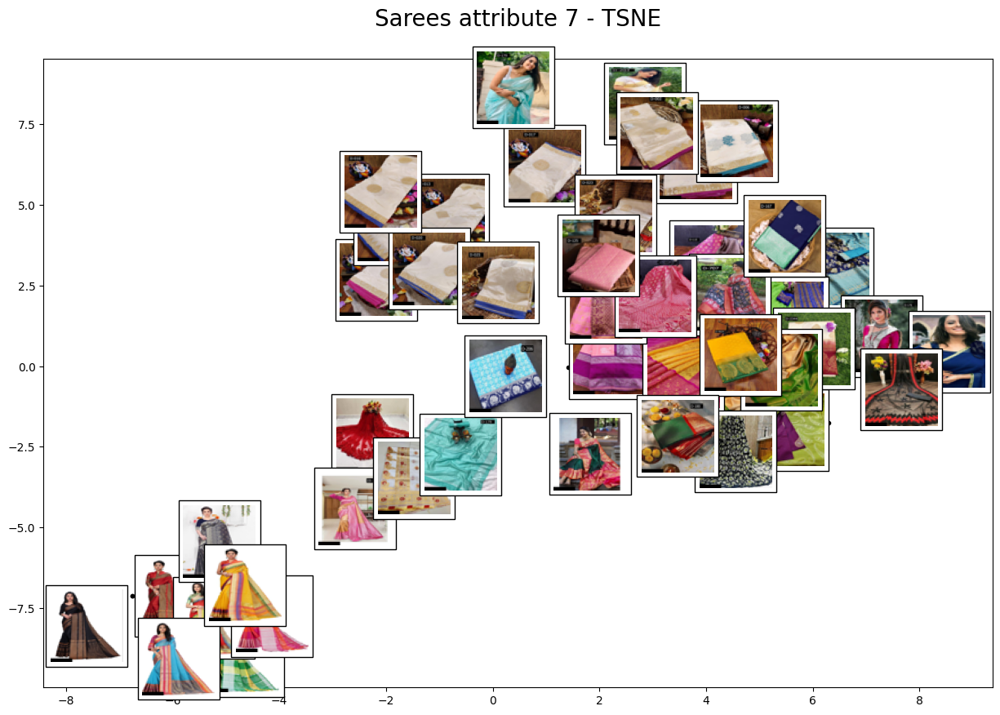

In [58]:
plot_components(images,tsne, actual_images)
plt.title("Sarees attribute 7 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

2 groups emerge: 2 clusters: top right has patterns printed on the saree, while the bottom left group has more heavily printed designs.

As we go bottom to top, colours change from bright to pastels.

In [59]:
images, actual_images = load_and_preprocess_images(samples['Sarees_attr_5'])

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


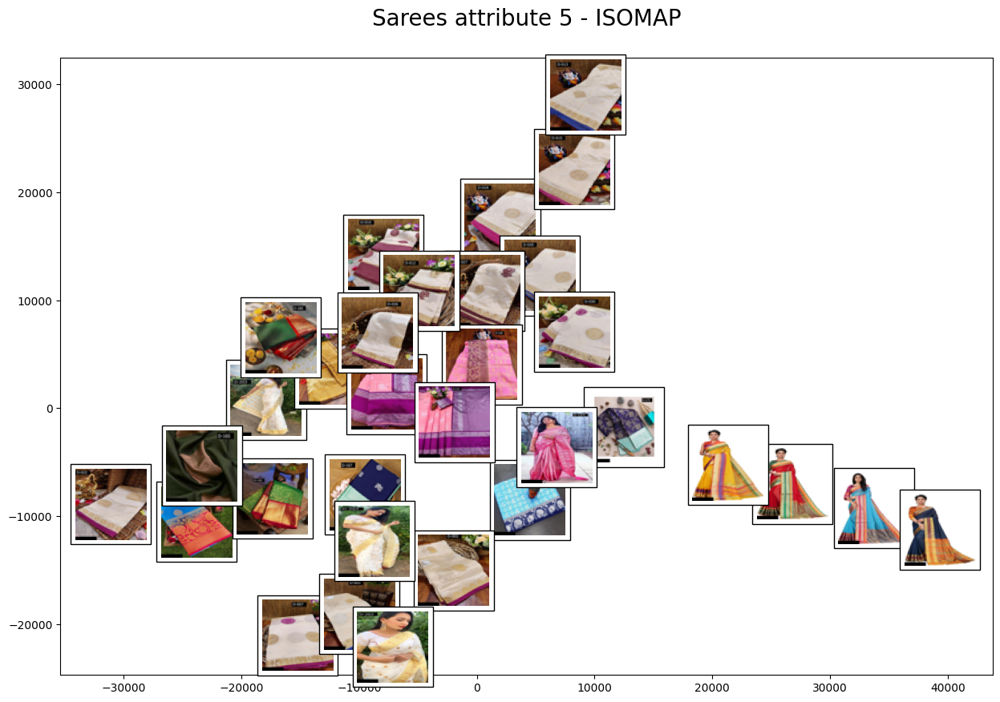

In [60]:
plot_components(images,isomap, actual_images)
plt.title("Sarees attribute 5 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X axis: colours go from pastels to bright.
Y axis: the design more or less remains the same.

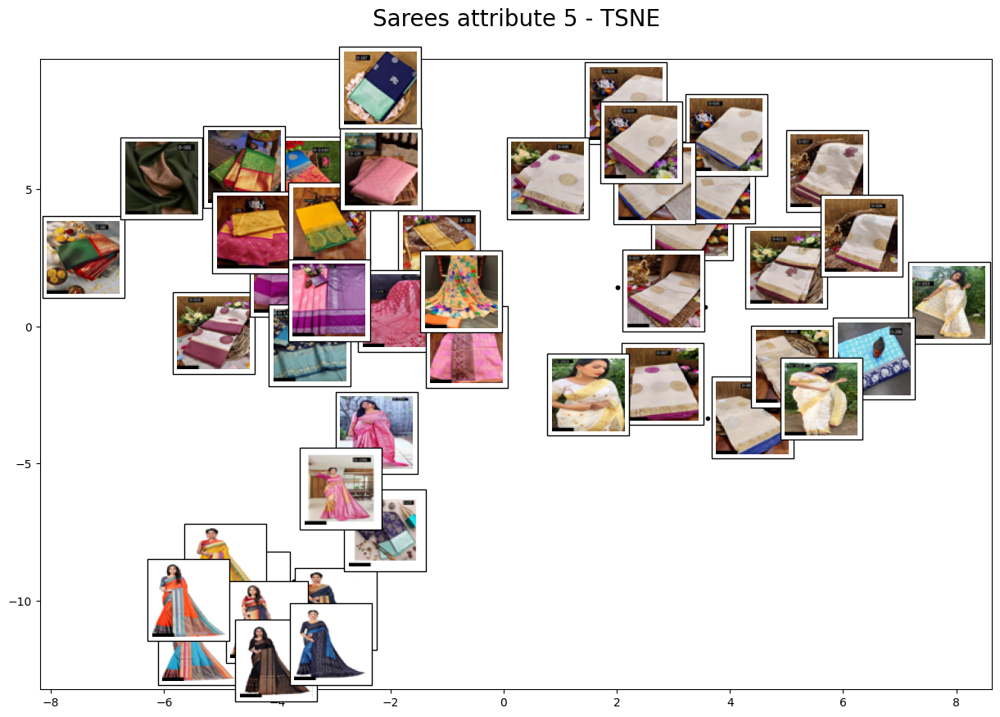

In [61]:
plot_components(images,tsne, actual_images)
plt.title("Sarees attribute 5 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

3 groips emerge:
1. top right: pastel colours with light prints and light borders.
2. top left: plain sarees in vibrant colours with heavy designs.
3. bottom: heavy printed sarees.

c.) **Kurtis** 

In [62]:
images, actual_images = load_and_preprocess_images(samples['Kurtis_attr_9'])

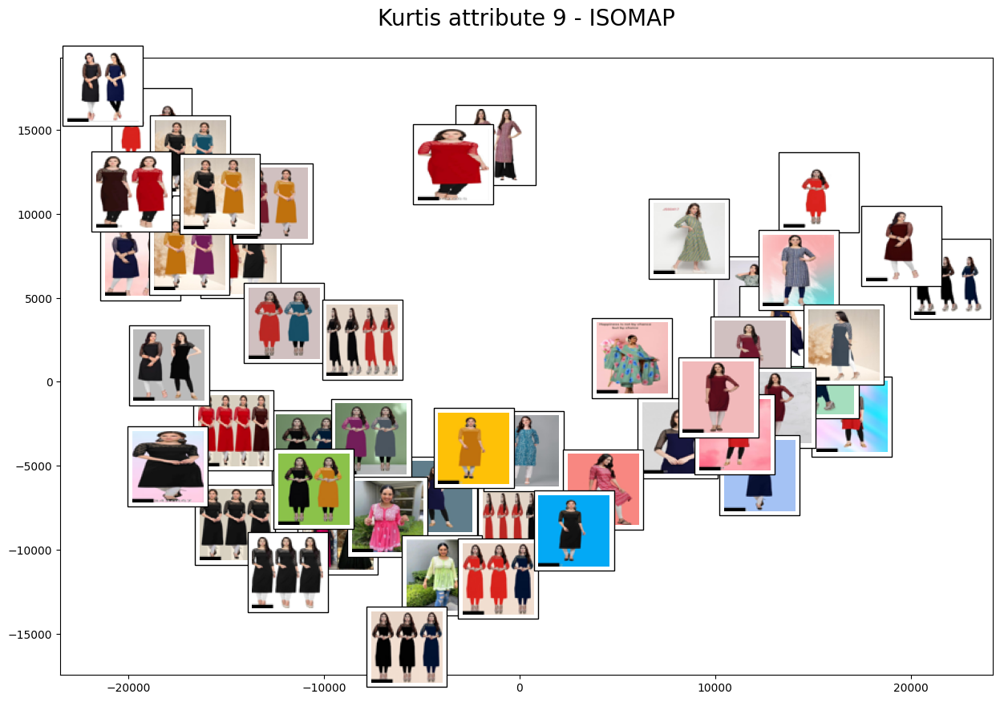

In [63]:
plot_components(images,isomap, actual_images)
plt.title("Kurtis attribute 9 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x - axis -> number of models

y - axis -> intensity of background color

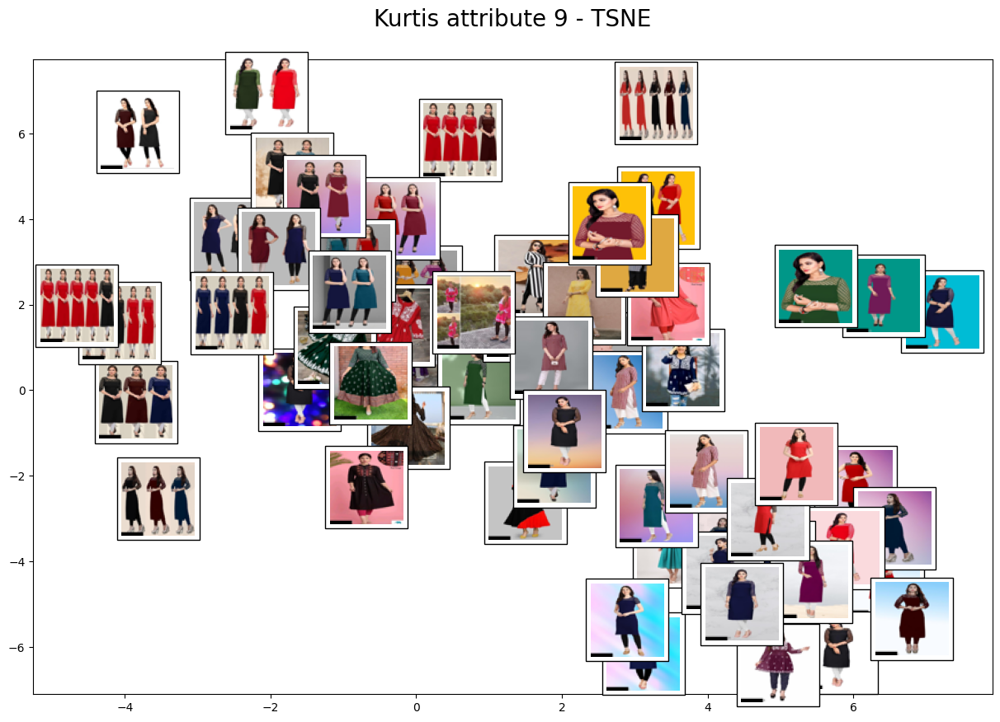

In [170]:
plot_components(images,tsne, actual_images)
plt.title("Kurtis attribute 9 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

The middle clusters have printed kurtis, the kurtis on the edges have solid colours, no patterns.

In [64]:
images, actual_images = load_and_preprocess_images(samples['Kurtis_attr_5'])

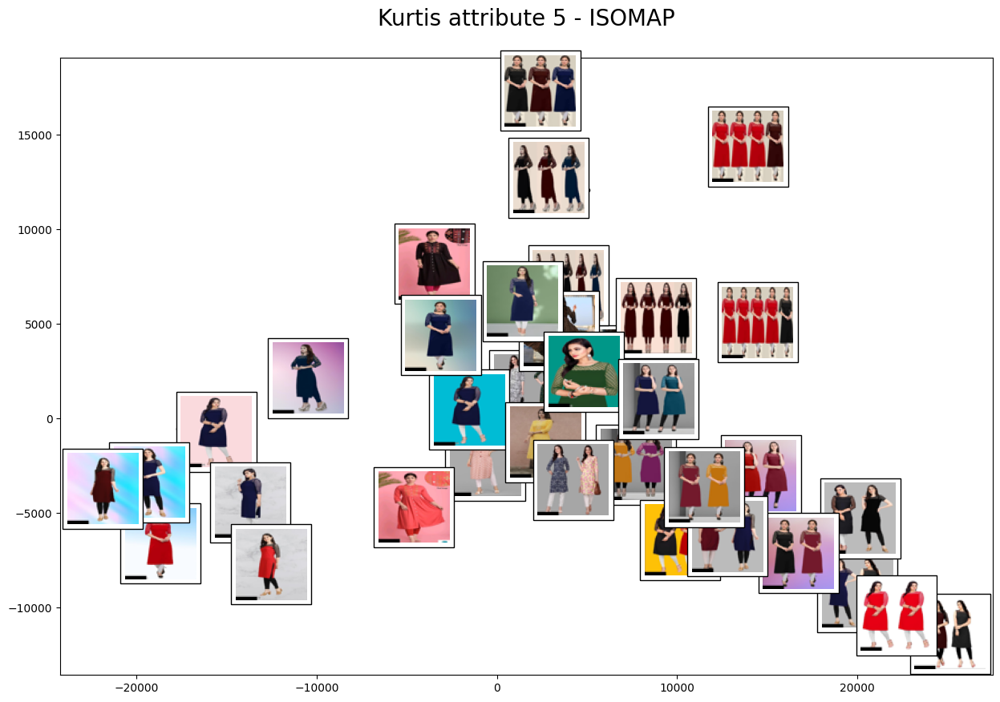

In [168]:
plot_components(images,isomap, actual_images)
plt.title("Kurtis attribute 5 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

The middle clusters have printed kurtis, the kurtis on the edges have solid colours, no patterns.

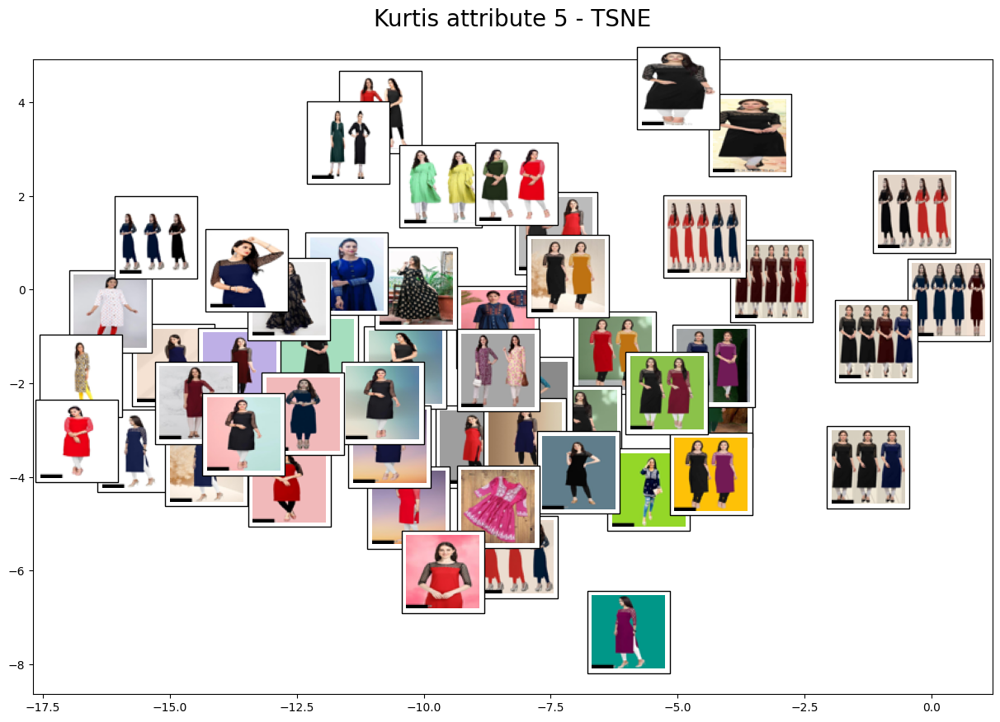

In [65]:
plot_components(images,tsne, actual_images)
plt.title("Kurtis attribute 5 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

The middle clusters have printed kurtis, the kurtis on the edges have solid colours, no patterns. Kurtis with lighter colour schemes are on the left, with changes to black as we go to right

d.) **Women Tshirts**

In [172]:
images, actual_images = load_and_preprocess_images(samples['Women Tshirts_attr_7'])

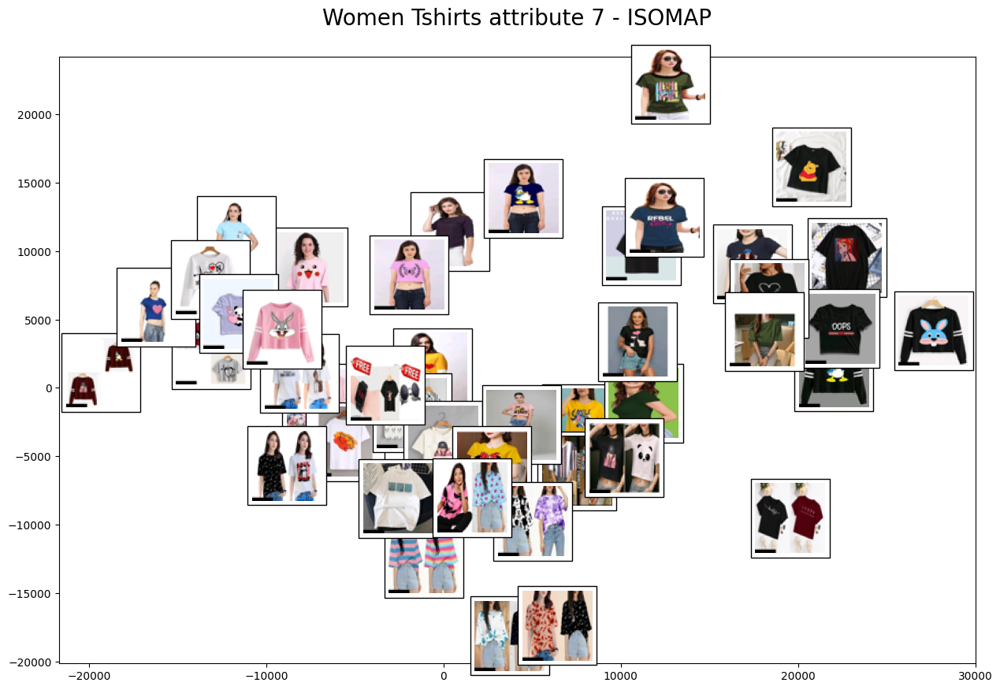

In [173]:
plot_components(images,isomap, actual_images)
plt.title("Women Tshirts attribute 7 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

Colours go from lighter shades to dark as we go from left to right. 

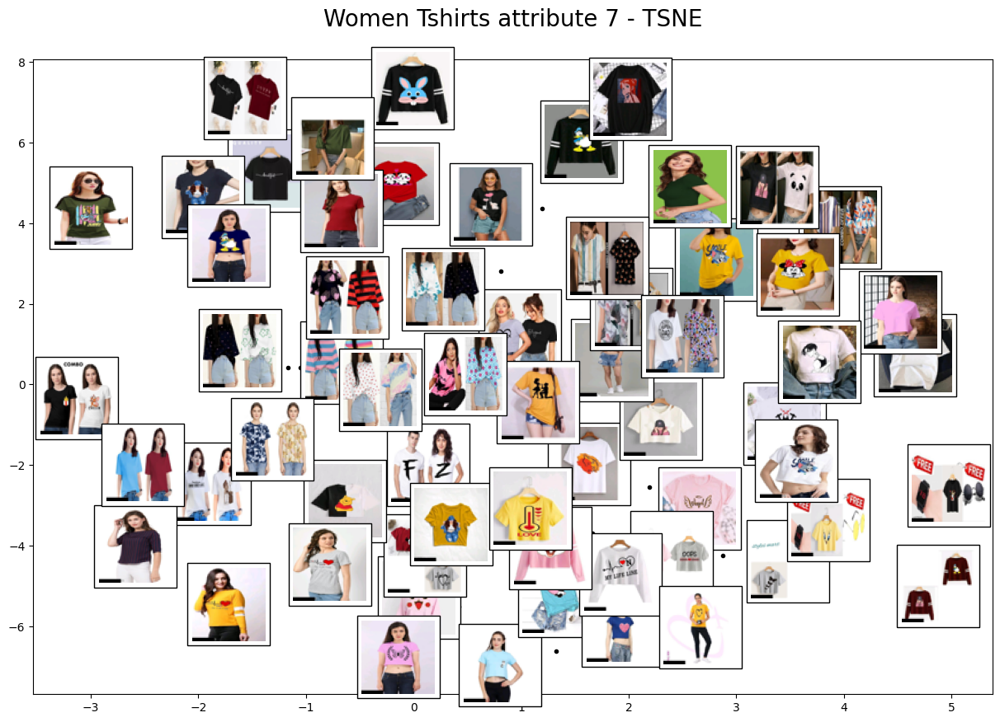

In [175]:
plot_components(images,tsne, actual_images)
plt.title("Women Tshirts attribute 7 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X axis: length of tshirts go from long to short top to bottom. 
y axis : colour scheme goes from dark to light

In [66]:
images, actual_images = load_and_preprocess_images(samples['Women Tshirts_attr_1'])

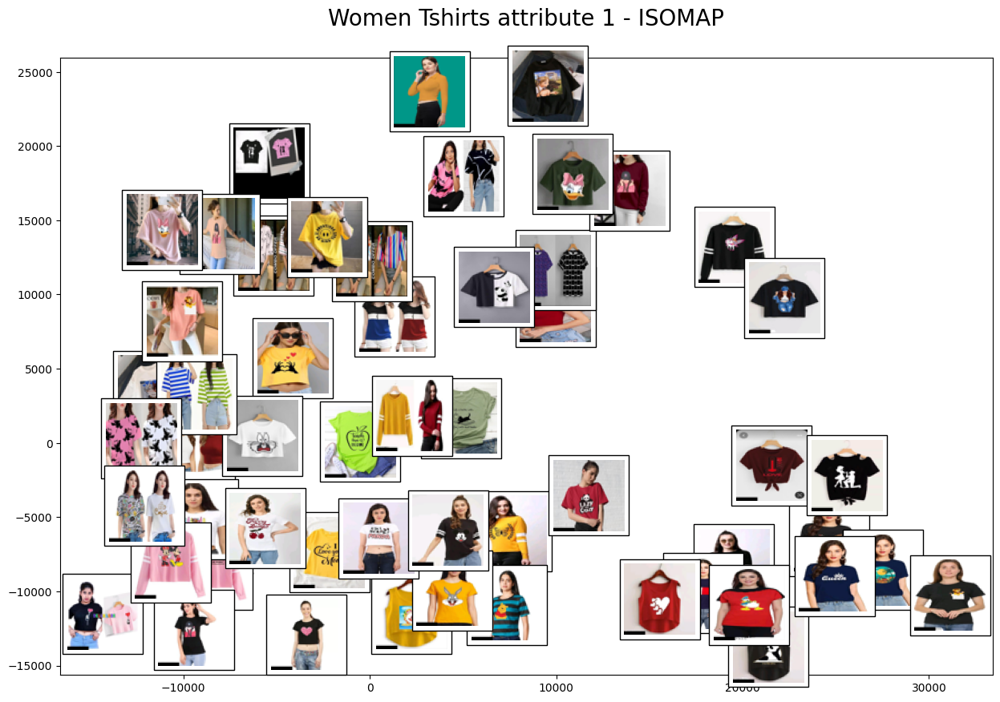

In [67]:
plot_components(images,isomap, actual_images)
plt.title("Women Tshirts attribute 1 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X axis: colour shade goes from light to dark.


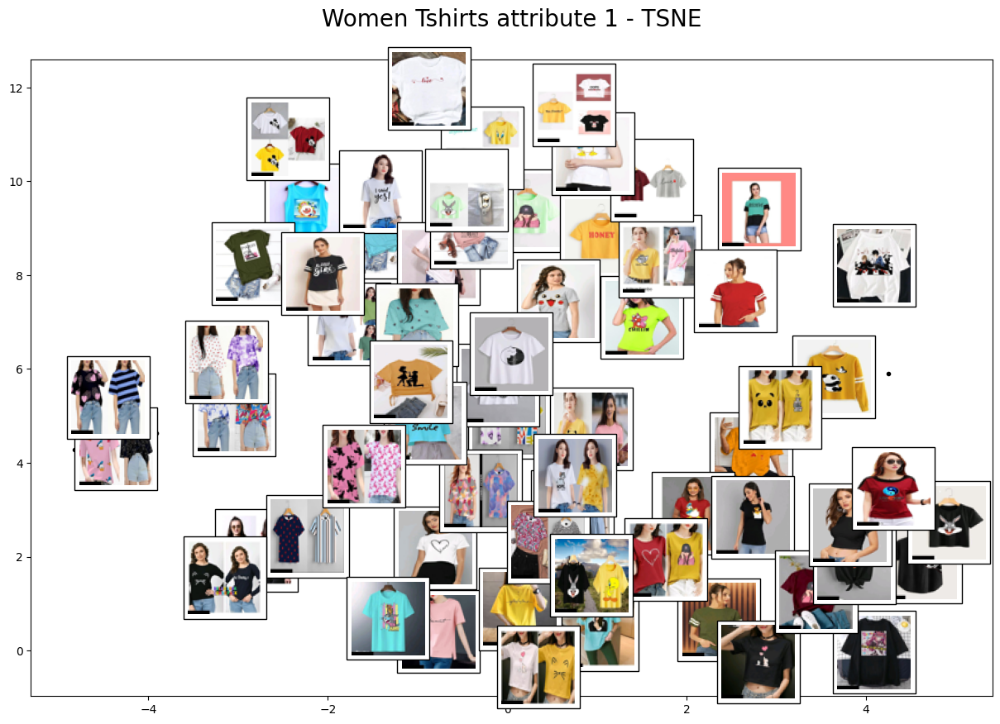

In [178]:
plot_components(images,tsne, actual_images)
plt.title("Women Tshirts attribute 1 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

e.) **Women Tops & Tunics**

In [179]:
images, actual_images = load_and_preprocess_images(samples['Women Tops & Tunics_attr_4'])

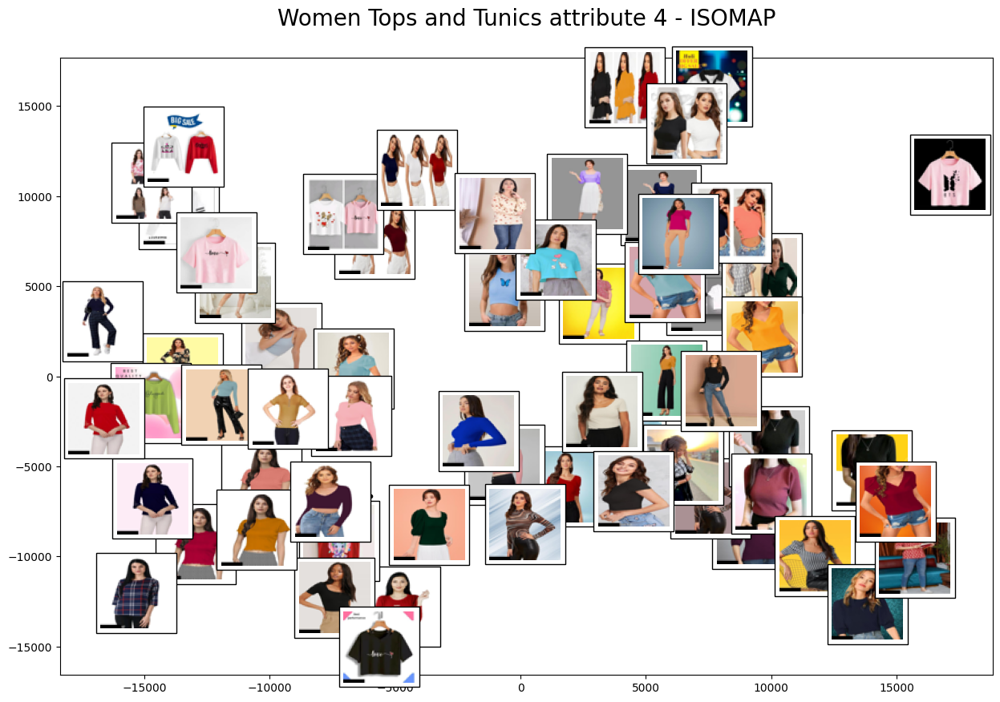

In [180]:
plot_components(images,isomap, actual_images)
plt.title("Women Tops and Tunics attribute 4 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

X axis: sleeve length decreases along the axis

y axis : colours go from dark to light.

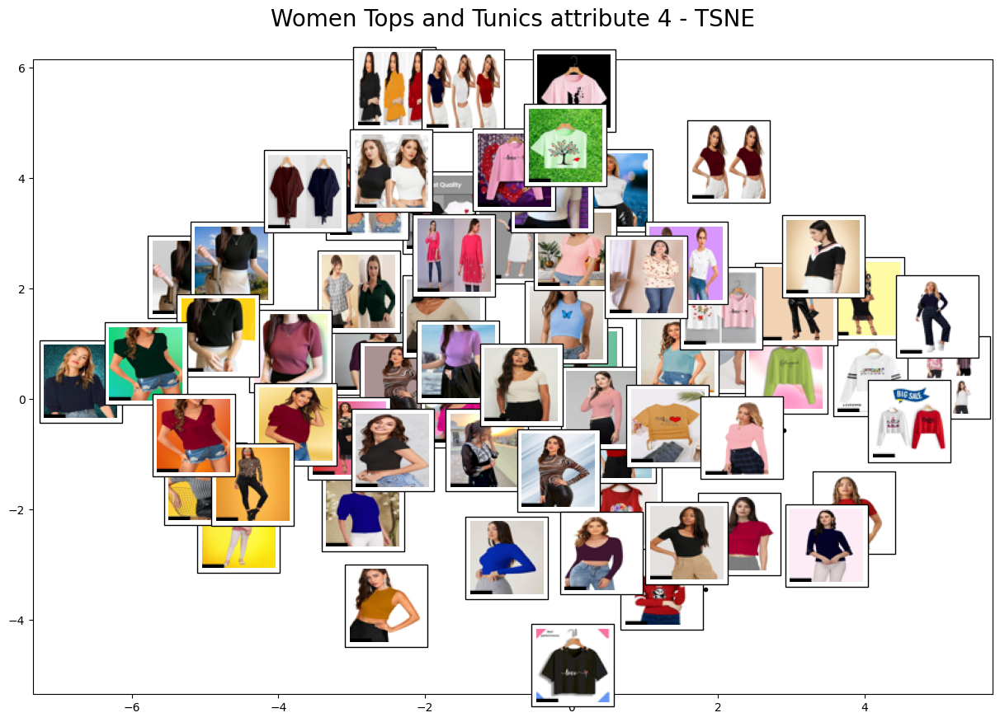

In [181]:
plot_components(images,tsne, actual_images)
plt.title("Women Tops and Tunics attribute 4 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)

x axis:sleeve length goes from short to long

In [182]:
images, actual_images = load_and_preprocess_images(samples['Women Tops & Tunics_attr_1'])

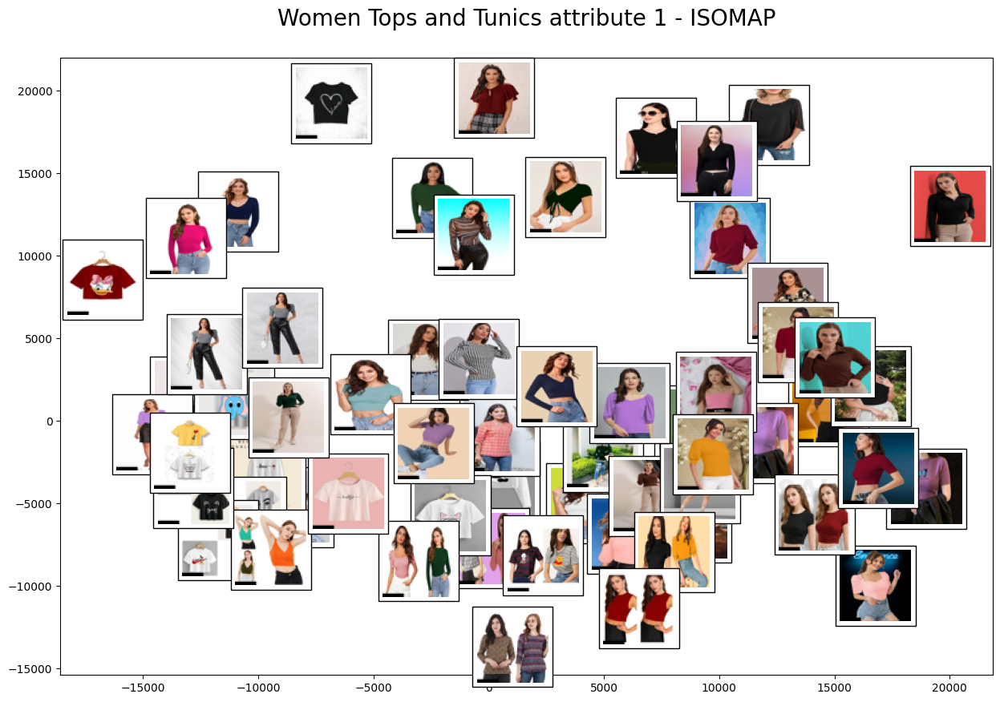

In [184]:
plot_components(images,isomap, actual_images)
plt.title("Women Tops and Tunics attribute 1 - ISOMAP\n", size = 20)
plt.gcf().set_size_inches(15, 10)

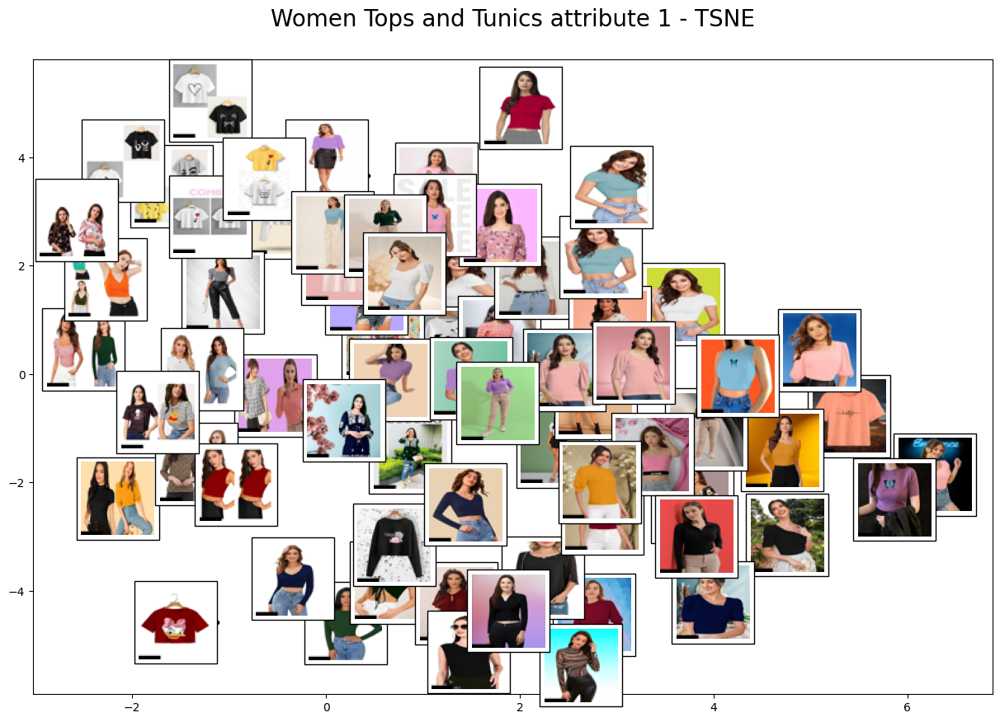

In [185]:
plot_components(images,tsne, actual_images)
plt.title("Women Tops and Tunics attribute 1 - TSNE\n", size = 20)
plt.gcf().set_size_inches(15, 10)